In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

## Loading the Dataset

In [2]:
netflix_overall=pd.read_csv("../resources/netflix_titles.csv")
netflix_overall.head()


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [3]:
netflix_overall.count()

show_id         8807
type            8807
title           8807
director        6173
cast            7982
country         7976
date_added      8797
release_year    8807
rating          8803
duration        8804
listed_in       8807
description     8807
dtype: int64

In [4]:
netflix_shows=netflix_overall[netflix_overall['type']=='TV Show']


In [5]:
netflix_movies=netflix_overall[netflix_overall['type']=='Movie']

### It is evident that there are more Movies on Netflix than TV shows

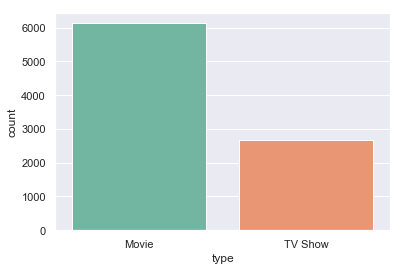

In [6]:
sns.set(style="darkgrid")
ax = sns.countplot(x="type", data=netflix_overall, palette="Set2")

### If you are a producer wants to release some new cotent, which months have less competition? ( the month when least amount of content is added)

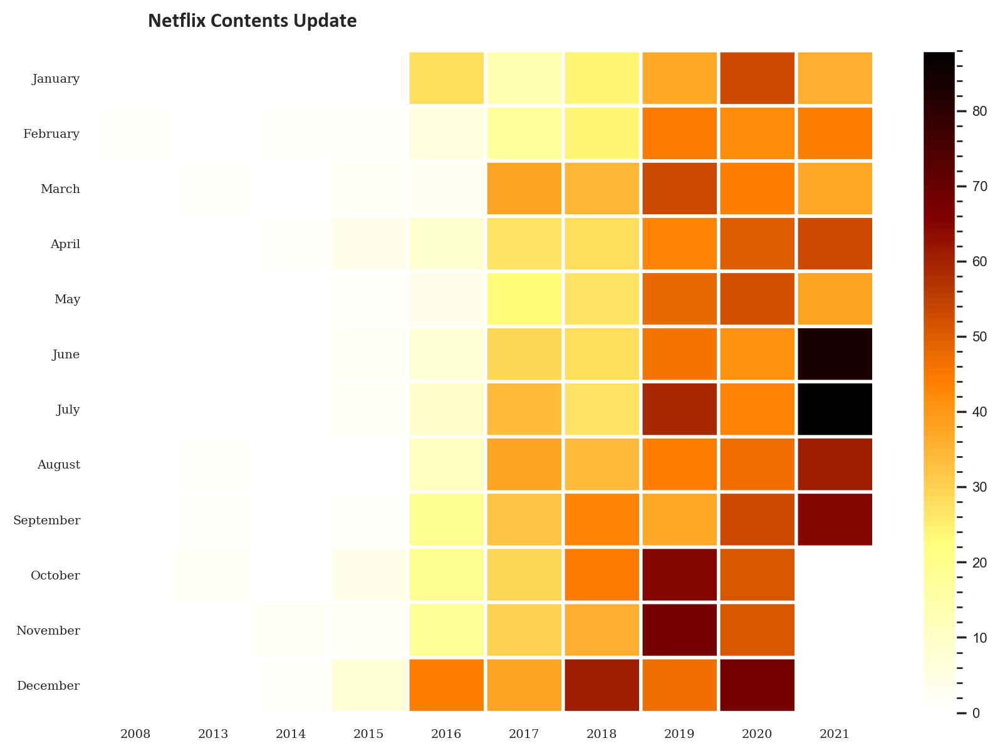

In [7]:
netflix_date = netflix_shows[['date_added']].dropna()
netflix_date['year'] = netflix_date['date_added'].apply(lambda x : x.split(', ')[-1])
netflix_date['month'] = netflix_date['date_added'].apply(lambda x : x.lstrip().split(' ')[0])

month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'][::-1]
df = netflix_date.groupby('year')['month'].value_counts().unstack().fillna(0)[month_order].T
plt.figure(figsize=(10, 7), dpi=200)
plt.pcolor(df, cmap='afmhot_r', edgecolors='white', linewidths=2) # heatmap
plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, fontsize=7, fontfamily='serif')
plt.yticks(np.arange(0.5, len(df.index), 1), df.index, fontsize=7, fontfamily='serif')

plt.title('Netflix Contents Update', fontsize=12, fontfamily='calibri', fontweight='bold', position=(0.20, 1.0+0.02))
cbar = plt.colorbar()

cbar.ax.tick_params(labelsize=8) 
cbar.ax.minorticks_on()
plt.show()

### it looks like the first 2 months of the year are comparatively less competitive and Jan and Feb might be a good choice for the producer, while June, July, August will give you more choices as viewers.

'The largest count of movies are made with the \'TV-MA\' rating.\n"TV-MA" is a rating assigned by the TV Parental Guidelines to a television program that was designed for mature audiences only.\nSecond largest is the \'TV-14\' stands for content that may be inappropriate for children younger than 14 years of age.\nThird largest is the very popular \'R\' rating.\nAn R-rated film is a film that has been assessed as having material which may be unsuitable for children under the age of 17 by the Motion Picture Association of America; \nthe MPAA writes "Under 17 requires accompanying parent or adult guardian '

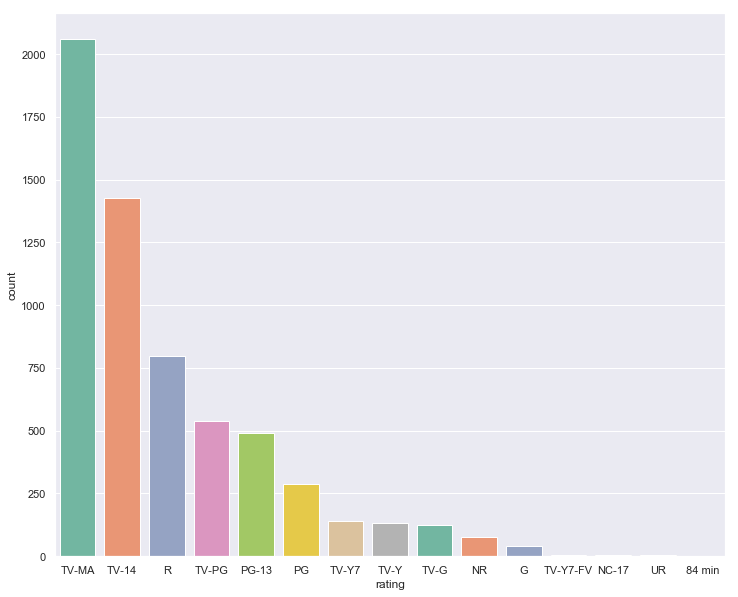

In [8]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(x="rating", data=netflix_movies, palette="Set2", order=netflix_movies['rating'].value_counts().index[0:15])

'''The largest count of movies are made with the 'TV-MA' rating.
"TV-MA" is a rating assigned by the TV Parental Guidelines to a television program that was designed for mature audiences only.
Second largest is the 'TV-14' stands for content that may be inappropriate for children younger than 14 years of age.
Third largest is the very popular 'R' rating.
An R-rated film is a film that has been assessed as having material which may be unsuitable for children under the age of 17 by the Motion Picture Association of America; 
the MPAA writes "Under 17 requires accompanying parent or adult guardian '''

### Analysing IMDB ratings to get top rated movies on Netflix
IMDb is an online database of information related to films, television series, home videos, video games, and streaming content online – including cast, production crew and personal biographies, plot summaries, trivia, ratings, and fan and critical reviews.

In [9]:
imdb_ratings=pd.read_csv('../resources/IMDb ratings.csv',usecols=['weighted_average_vote'])
imdb_titles=pd.read_csv('../resources/IMDb movies.csv', usecols=['title','year','genre'])
ratings = pd.DataFrame({'Title':imdb_titles.title,
                    'Release Year':imdb_titles.year,
                    'Rating': imdb_ratings.weighted_average_vote,
                    'Genre':imdb_titles.genre})
ratings.drop_duplicates(subset=['Title','Release Year','Rating'], inplace=True)
ratings.shape

D:\RW_Programs\Anaconda\envs\pyvizenv\lib\site-packages\IPython\core\interactiveshell.py:3166: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(85852, 4)

In [10]:
ratings.dropna()
joint_data=ratings.merge(netflix_overall,left_on='Title',right_on='title',how='inner')
joint_data=joint_data.sort_values(by='Rating', ascending=False)

In [11]:
# pip install plotly

In [12]:
joint_data.head(10)

,Title,Release Year,Rating,Genre,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
1105,Innocent,2017,9.0,Comedy,s4175,TV Show,Innocent,Seren Yüce,"Ali Atay, Haluk Bilginer, Nur Sürer, Okan Yala...",Turkey,"January 23, 2019",2017,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Dramas","In a peaceful, rustic town, a retired officer ..."
1116,Breakout,2019,9.0,"Adventure, Comedy, Drama",s5394,TV Show,Breakout,NaN,"Jeanette Aw, Elvin Ng, Zhou Ying, Christopher ...",NaN,"July 1, 2017",2010,TV-14,1 Season,"International TV Shows, TV Dramas",After losing her family in a suspicious car cr...
441,Pulp Fiction,1994,8.9,"Crime, Drama",s7803,Movie,Pulp Fiction,Quentin Tarantino,"John Travolta, Samuel L. Jackson, Uma Thurman,...",United States,"January 1, 2019",1994,R,154 min,"Classic Movies, Cult Movies, Dramas",This stylized crime caper weaves together stor...
421,Schindler's List,1993,8.9,"Biography, Drama, History",s7958,Movie,Schindler's List,Steven Spielberg,"Liam Neeson, Ben Kingsley, Ralph Fiennes, Caro...",United States,"April 1, 2018",1993,R,195 min,"Classic Movies, Dramas",Oskar Schindler becomes an unlikely humanitari...
1442,Inception,2010,8.8,"Action, Adventure, Sci-Fi",s341,Movie,Inception,Christopher Nolan,"Leonardo DiCaprio, Joseph Gordon-Levitt, Ellio...","United States, United Kingdom","August 1, 2021",2010,PG-13,148 min,"Action & Adventure, Sci-Fi & Fantasy, Thrillers",A troubled thief who extracts secrets from peo...
1842,Much Ado About Nothing,2011,8.6,"Comedy, Romance",s5771,Movie,Much Ado About Nothing,Alejandro Fernández Almendras,"Agustín Silva, Paulina García, Daniel Alcaíno,...","Chile, United States, France","October 1, 2016",2016,TV-MA,96 min,"Dramas, Independent Movies, International Movies",Carefree college student Vicente ends up in a ...
693,Koshish,1972,8.6,Drama,s7225,Movie,Koshish,Gulzar,"Sanjeev Kumar, Jaya Bhaduri, Asrani, Seema, Om...",India,"December 31, 2019",1972,TV-14,115 min,"International Movies, Romantic Movies",A speech and hearing-impaired couple persists ...
826,City of God,2002,8.6,"Crime, Drama",s6489,Movie,City of God,"Fernando Meirelles, Katia Lund","Alexandre Rodrigues, Leandro Firmino, Phellipe...","Brazil, France, Germany","January 1, 2020",2002,R,130 min,"Dramas, Independent Movies, International Movies","Growing up in a Rio de Janeiro slum, Rocket is..."
1233,Oththa Seruppu Size 7,2019,8.6,Drama,s3313,Movie,Oththa Seruppu Size 7,Parthiban,Parthiban,India,"November 4, 2019",2019,TV-MA,103 min,"Dramas, International Movies, Thrillers","Taken into custody, a murder suspect's theatri..."
469,Seven,1995,8.6,"Crime, Drama, Mystery",s959,Movie,Seven,Tosin Igho,"Efa Iwara, Richard Mofe-Damijo, Bimbo Manuel, ...",NaN,"April 30, 2021",2019,TV-14,113 min,"Dramas, International Movies","After his affluent father passes, a man must s..."


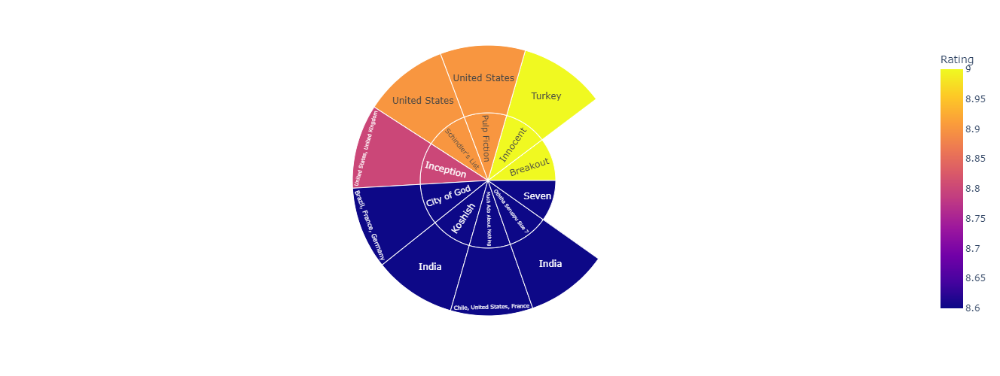

In [13]:
import plotly.express as px
top_rated=joint_data[0:10]
fig =px.sunburst(
    top_rated,
    path=['title','country'],   # coutries with highest rated content.
    values='Rating',
    color='Rating',
height=500,
)
fig.show()

In [14]:
country_count=joint_data['country'].value_counts().sort_values(ascending=False)
country_count=pd.DataFrame(country_count)
topcountries=country_count[0:11]
topcountries

,country
United States,865
India,718
United Kingdom,119
Canada,57
Philippines,50
Spain,41
South Korea,38
Indonesia,38
France,37
Nigeria,31


In [15]:
data = topcountries.to_dict()['country']
data
number =[]
country =[]

for k,v in data.items():            # to extract key and values for funnel plot
    number.append(v)
    country.append(k)
    
print(number)
print(country)


[865, 718, 119, 57, 50, 41, 38, 38, 37, 31, 31]
['United States', 'India', 'United Kingdom', 'Canada', 'Philippines', 'Spain', 'South Korea', 'Indonesia', 'France', 'Nigeria', 'United Kingdom, United States']


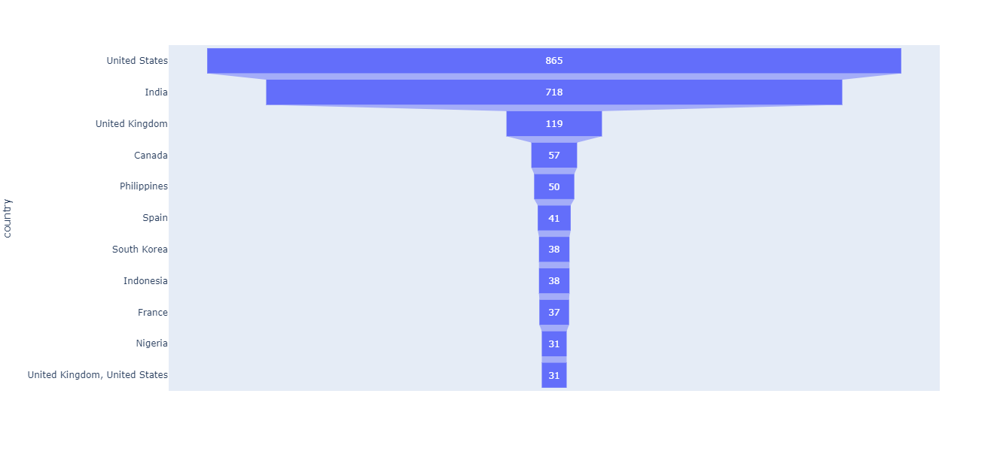

In [16]:
import plotly.express as px
data = dict(
    number = number,
    country = country)
fig = px.funnel(data, x='number', y='country',height =600)
fig.show()

### Annual content release

2017&2018 have lots of new release while 2020 &2021 release activity dropped significantly might due to pandemic lockdown etc.

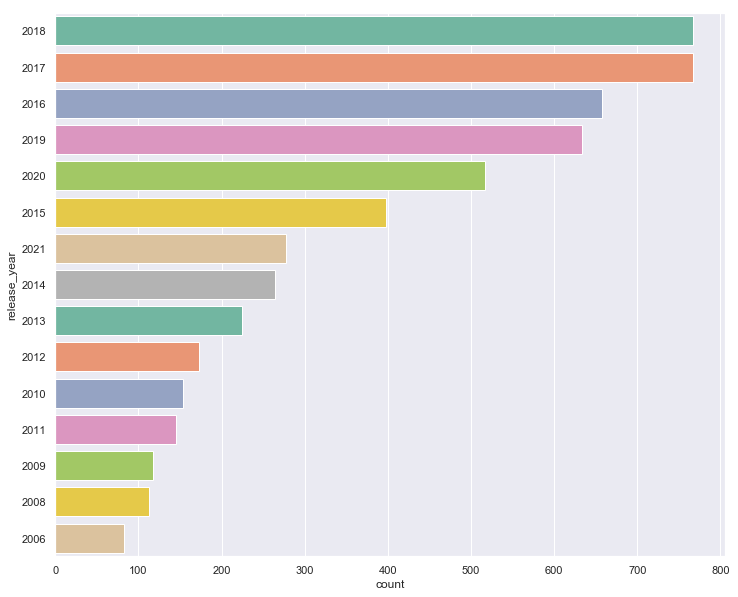

In [17]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="release_year", data=netflix_movies, palette="Set2", order=netflix_movies['release_year'].value_counts().index[0:15])

### Top 10 Movie Content Creating Countries

In [18]:
countries={}
netflix_movies['country']=netflix_movies['country'].fillna('Unknown')
cou=list(netflix_movies['country'])
for i in cou:
    #print(i)
    i=list(i.split(','))
    if len(i)==1:
        if i in list(countries.keys()):
            countries[i]+=1
        else:
            countries[i[0]]=1
    else:
        for j in i:
            if j in list(countries.keys()):
                countries[j]+=1
            else:
                countries[j]=1

D:\RW_Programs\Anaconda\envs\pyvizenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [19]:
countries_fin={}
for country,no in countries.items():
    country=country.replace(' ','')
    if country in list(countries_fin.keys()):
        countries_fin[country]+=no
    else:
        countries_fin[country]=no
        
countries_fin={k: v for k, v in sorted(countries_fin.items(), key=lambda item: item[1], reverse= True)}

[Text(0, 0, 'UnitedStates'),
 Text(0, 0, 'France'),
 Text(0, 0, 'UnitedKingdom'),
 Text(0, 0, 'Canada'),
 Text(0, 0, 'Germany'),
 Text(0, 0, 'Belgium'),
 Text(0, 0, 'China'),
 Text(0, 0, 'Spain'),
 Text(0, 0, 'Japan'),
 Text(0, 0, 'India')]

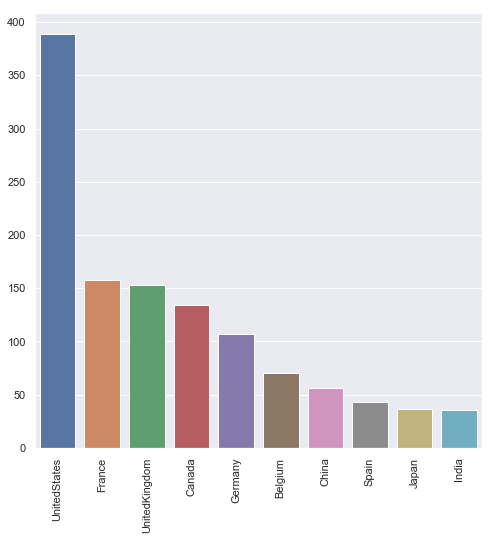

In [20]:
plt.figure(figsize=(8,8))
ax = sns.barplot(x=list(countries_fin.keys())[0:10],y=list(countries_fin.values())[0:10])
ax.set_xticklabels(list(countries_fin.keys())[0:10],rotation = 90)

In [21]:
from collections import Counter

genres=list(netflix_movies['listed_in'])
gen=[]

for i in genres:
    i=list(i.split(','))
    for j in i:
        gen.append(j.replace(' ',""))
g=Counter(gen)

In [22]:
pip install wordcloud

  Using cached wordcloud-1.8.1-cp37-cp37m-win_amd64.whl (154 kB)
Note: you may need to restart the kernel to use updated packages.


## WordCloud for Genres.

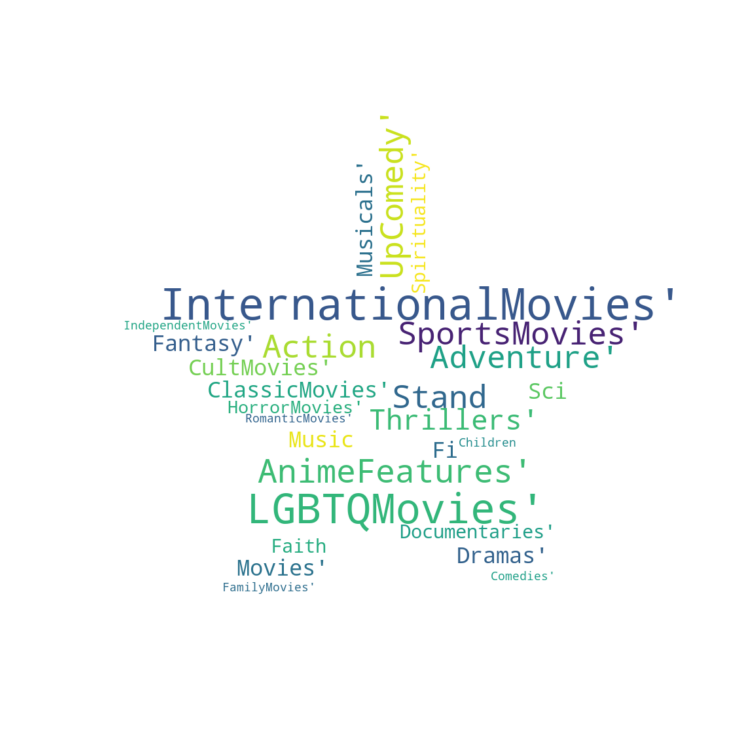

In [23]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

text = list(set(gen))
plt.rcParams['figure.figsize'] = (13, 13)

#assigning shape to the word cloud
mask = np.array(Image.open('../masks/star.png'))
wordcloud = WordCloud(max_words=1000000,background_color="white",mask=mask).generate(str(text))

plt.imshow(wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()

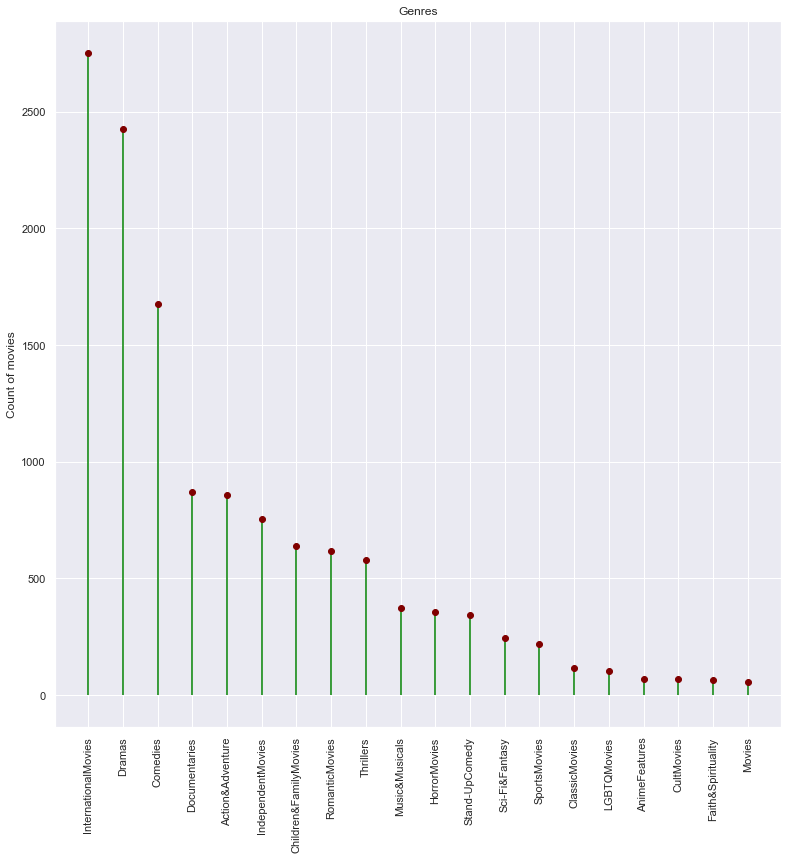

<Figure size 720x720 with 0 Axes>

In [24]:
g = {k: v for k, v in sorted(g.items(), key=lambda item: item[1], reverse= True)}


fig, ax = plt.subplots()

fig = plt.figure(figsize = (10, 10))
x=list(g.keys())
y=list(g.values())
ax.vlines(x, ymin=0, ymax=y, color='green')
ax.plot(x,y, "o", color='maroon')
ax.set_xticklabels(x, rotation = 90)
ax.set_ylabel("Count of movies")
# set a title
ax.set_title("Genres");

### Analysis of TV SERIES on Netflix

In [25]:
countries1={}
netflix_shows['country']=netflix_shows['country'].fillna('Unknown')
cou1=list(netflix_shows['country'])
for i in cou1:
    #print(i)
    i=list(i.split(','))
    if len(i)==1:
        if i in list(countries1.keys()):
            countries1[i]+=1
        else:
            countries1[i[0]]=1
    else:
        for j in i:
            if j in list(countries1.keys()):
                countries1[j]+=1
            else:
                countries1[j]=1

D:\RW_Programs\Anaconda\envs\pyvizenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [26]:
countries_fin1={}
for country,no in countries1.items():
    country=country.replace(' ','')
    if country in list(countries_fin1.keys()):
        countries_fin1[country]+=no
    else:
        countries_fin1[country]=no
        
countries_fin1={k: v for k, v in sorted(countries_fin1.items(), key=lambda item: item[1], reverse= True)}

### Most content creating countries

Text(0, 0.5, 'Arrival delay (in minutes)')

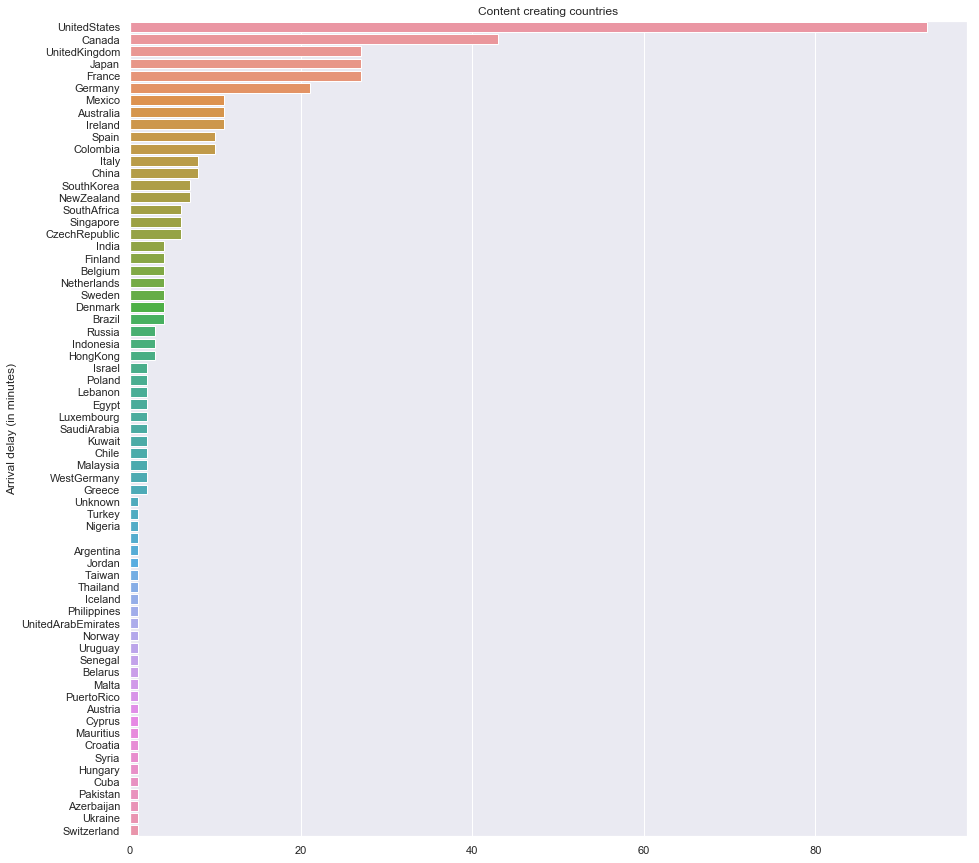

In [27]:
# Set the width and height of the figure
plt.figure(figsize=(15,15))

# Add title
plt.title("Content creating countries")

# Bar chart showing average arrival delay for Spirit Airlines flights by month
sns.barplot(y=list(countries_fin1.keys()), x=list(countries_fin1.values()))

# Add label for vertical axis
plt.ylabel("Arrival delay (in minutes)")

#United States has the most content that is created on netflix in the tv series category

### TV shows with largest number of seasons

In [28]:
features=['title','duration']
durations= netflix_shows[features]

durations['no_of_seasons']=durations['duration'].str.replace(' Season','')

#durations['no_of_seasons']=durations['no_of_seasons'].astype(str).astype(int)
durations['no_of_seasons']=durations['no_of_seasons'].str.replace('s','')

D:\RW_Programs\Anaconda\envs\pyvizenv\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

D:\RW_Programs\Anaconda\envs\pyvizenv\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [31]:
durations['no_of_seasons']=durations['no_of_seasons'].astype(str).astype(int)

D:\RW_Programs\Anaconda\envs\pyvizenv\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [32]:
t=['title','no_of_seasons']
top=durations[t]

top=top.sort_values(by='no_of_seasons', ascending=False)

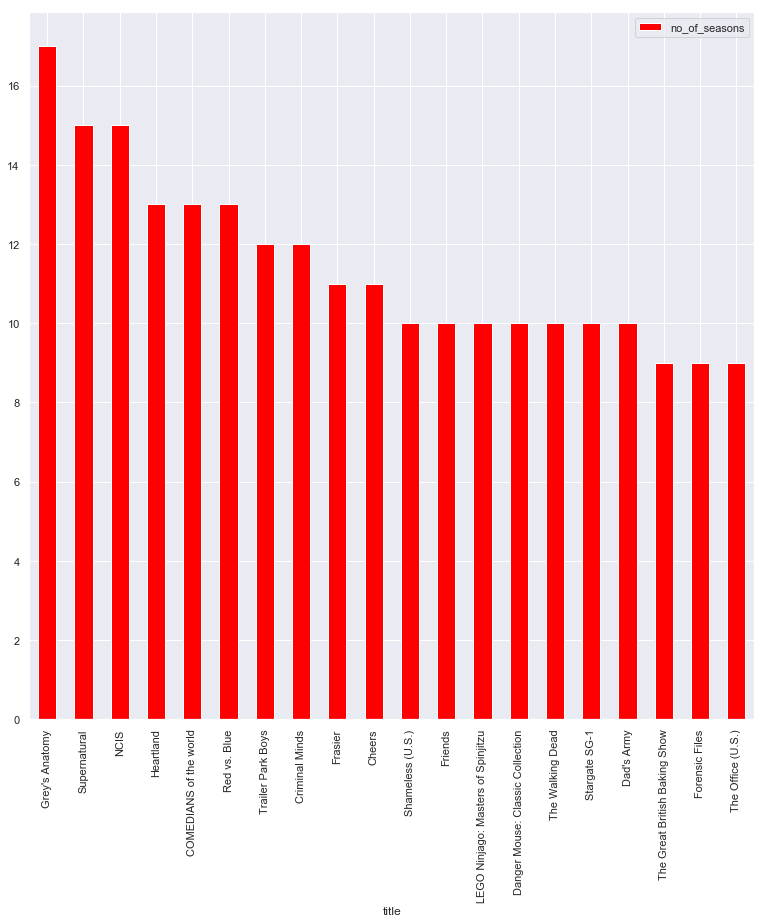

In [33]:
top20=top[0:20]
top20.plot(kind='bar',x='title',y='no_of_seasons', color='red')

### Lowest number of seasons

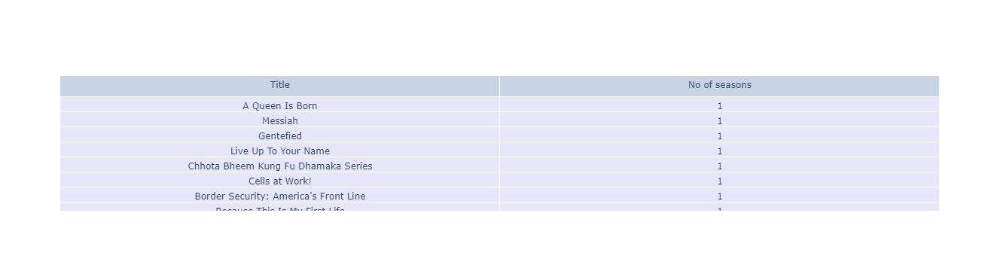

In [34]:
bottom=top.sort_values(by='no_of_seasons')
bottom=bottom[20:50]

import plotly.graph_objects as go

fig = go.Figure(data=[go.Table(header=dict(values=['Title', 'No of seasons']),
                 cells=dict(values=[bottom['title'],bottom['no_of_seasons']],fill_color='lavender'))
                     ])
fig.show()

### Word Cloud for Genres

In [35]:
genres=list(netflix_shows['listed_in'])
gen=[]

for i in genres:
    i=list(i.split(','))
    for j in i:
        gen.append(j.replace(' ',""))
g=Counter(gen)

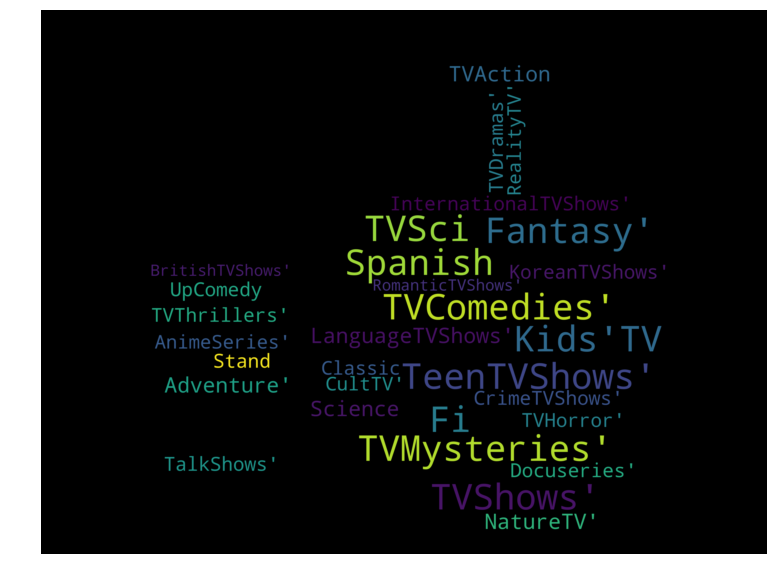

In [37]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

text = list(set(gen))

mask=np.array(Image.open('../masks/upvote.png'))
wordcloud = WordCloud(max_words=1000000,background_color="black",mask=mask).generate(str(text))
plt.rcParams['figure.figsize'] = (13, 13)
plt.imshow(wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()


In [38]:
us_series_data=netflix_shows[netflix_shows['country']=='United States']

In [39]:
oldest_us_series=us_series_data.sort_values(by='release_year')[0:20]

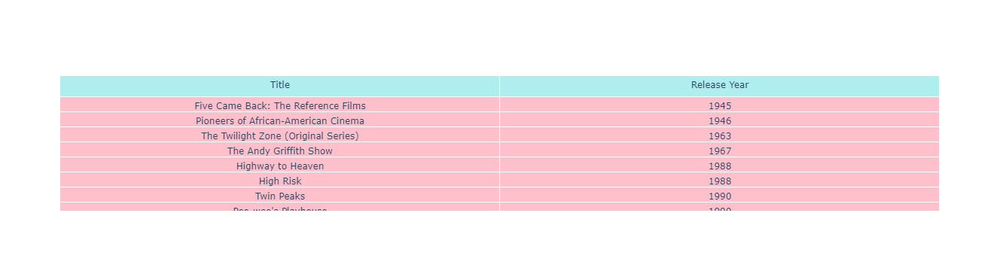

In [40]:
fig = go.Figure(data=[go.Table(header=dict(values=['Title', 'Release Year'],fill_color='paleturquoise'),
                 cells=dict(values=[oldest_us_series['title'],oldest_us_series['release_year']],fill_color='pink'))
                     ])
fig.show()

In [41]:
newest_us_series=us_series_data.sort_values(by='release_year', ascending=False)[0:50]

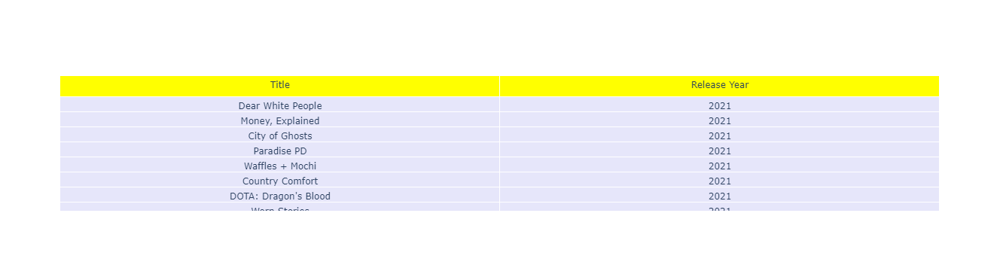

In [42]:
fig = go.Figure(data=[go.Table(header=dict(values=['Title', 'Release Year'],fill_color='yellow'),
                 cells=dict(values=[newest_us_series['title'],newest_us_series['release_year']],fill_color='lavender'))
                     ])
fig.show()

## Content in France

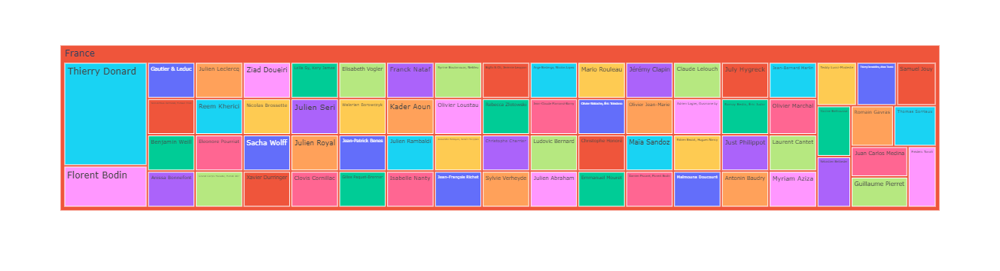

In [55]:
netflix_fr=netflix_overall[netflix_overall['country']=='France']
nannef=netflix_fr.dropna()
import plotly.express as px
fig = px.treemap(nannef, path=['country','director'],
                  color='director', hover_data=['director','title'],color_continuous_scale='Purples')
fig.show()

In [54]:
newest_fr_series=netflix_fr.sort_values(by='release_year', ascending=False)[0:20]

In [52]:
newest_fr_series

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
6462,s6463,TV Show,The Hook Up Plan,NaN,"Marc Ruchmann, Zita Hanrot, Sabrina Ouazani, J...",France,"October 11, 2019",2020,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...","When Parisian Elsa gets hung up on her ex, her..."
7388,s7389,TV Show,Vampires,NaN,"Oulaya Amamra, Suzanne Clément, Kate Moran, Mo...",France,"March 20, 2020",2020,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Horror","A Paris teen who's half human, half vampire gr..."
3729,s3730,Movie,Lost Bullet,Guillaume Pierret,"Alban Lenoir, Nicolas Duvauchelle, Ramzy Bedia...",France,"June 19, 2020",2020,TV-MA,93 min,"Action & Adventure, Dramas, International Movies","Facing a murder charge, a genius mechanic with..."
7365,s7366,TV Show,Until Dawn,NaN,"Ahmed Sylla, Alban Ivanov, Ornella Fleury, Nat...",France,"January 10, 2020",2020,TV-MA,1 Season,"International TV Shows, Reality TV, TV Comedies",France’s funniest comics carry out ghastly tas...
2414,s2415,Movie,GIMS: On the Record,Florent Bodin,Maître Gims,France,"September 17, 2020",2020,TV-MA,96 min,"Documentaries, International Movies, Music & M...",Go backstage with beloved rap superstar Gims i...
3502,s3503,TV Show,La Révolution,NaN,"Amir El Kacem, Marilou Aussilloux, Lionel Erdo...",France,"October 16, 2020",2020,TV-MA,1 Season,"International TV Shows, TV Action & Adventure,...","In a reimagined history, a mysterious disease ..."
7145,s7146,Movie,Tony Parker: The Final Shot,Florent Bodin,Tony Parker,France,"January 6, 2021",2020,TV-14,99 min,"Documentaries, International Movies, Sports Mo...",This film examines the background and career o...
7498,s7499,Movie,We Are One,Stéphane de Freitas,NaN,France,"July 14, 2020",2020,TV-MA,86 min,"Documentaries, International Movies, Music & M...",Activists around the world fight injustice and...
910,s911,Movie,Bigflo & Oli: Hip Hop Frenzy,"Bigflo & Oli, Jérémie Levypon",Bigflo & Oli,France,"October 8, 2020",2020,TV-MA,100 min,"Documentaries, International Movies, Music & M...",Go backstage with French rap duo Bigflo & Oli ...
2105,s2106,TV Show,Family Business,NaN,"Jonathan Cohen, Gérard Darmon, Julia Piaton, L...",France,"September 11, 2020",2020,TV-MA,2 Seasons,"International TV Shows, TV Comedies, TV Dramas",After learning France is about to legalize pot...


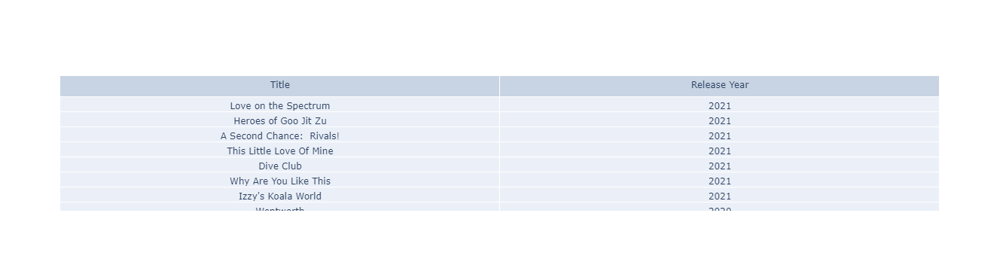

In [56]:
fig = go.Figure(data=[go.Table(header=dict(values=['Title', 'Release Year']),
                 cells=dict(values=[newest_fr_series['title'],newest_fr_series['release_year']]))
                     ])
fig.show()

### Top Duration

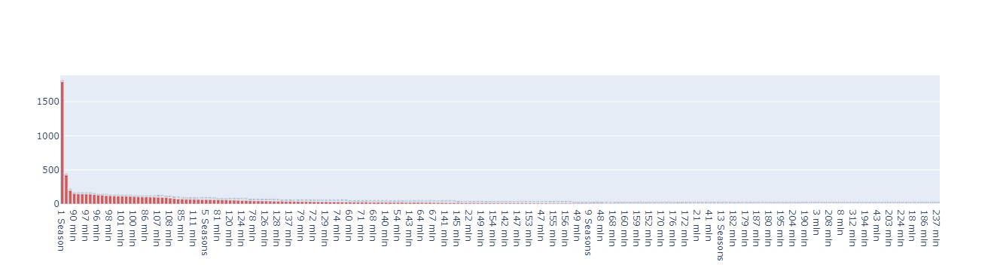

In [57]:
topdirs=pd.value_counts(netflix_overall['duration'])
fig = go.Figure([go.Bar(x=topdirs.index, y=topdirs.values , text=topdirs.values,marker_color='indianred')])
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()   #It can be inferred that having one season is the most preferred duration

## Recommendation System (Content Based)

In [59]:
from sklearn.feature_extraction.text import TfidfVectorizer

#### The TF-IDF(Term Frequency-Inverse Document Frequency (TF-IDF) ) score is the frequency of a word occurring in a document, down-weighted by the number of documents in which it occurs. This is done to reduce the importance of words that occur frequently in plot overviews and therefore, their significance in computing the final similarity score.

In [60]:
#removing stopwords
tfidf = TfidfVectorizer(stop_words='english')

#Replace NaN with an empty string
netflix_overall['description'] = netflix_overall['description'].fillna('')

#Construct the required TF-IDF matrix by fitting and transforming the data
tfidf_matrix = tfidf.fit_transform(netflix_overall['description'])

#Output the shape of tfidf_matrix
tfidf_matrix.shape

(8807, 18895)

In [61]:
# Import linear_kernel
from sklearn.metrics.pairwise import linear_kernel

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

In [62]:
indices = pd.Series(netflix_overall.index, index=netflix_overall['title']).drop_duplicates()

In [63]:
def get_recommendations(title, cosine_sim=cosine_sim):
    idx = indices[title]

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return netflix_overall['title'].iloc[movie_indices]

In [66]:
get_recommendations('Inception')

1939                       Dedh Ishqiya
6304           Big Dreams, Small Spaces
6726                    Eyyvah Eyyvah 2
5202                    Strange Weather
3796    Hyper HardBoiled Gourmet Report
1536                          Incarnate
1359                       The Bank Job
1621                 Quigley Down Under
7855                           Rememory
4131                  Violet Evergarden
Name: title, dtype: object

In [65]:
get_recommendations('Squid Game')

1011                         Free to Play
1440                    Nailed It! Mexico
1242             Murder Among the Mormons
5903                                Creep
1615                           Ink Master
2914                           Isi & Ossi
4789                       King of Peking
834                          Blue Miracle
5411    Zipi & Zape y la Isla del Capitan
2591                       The Half Of It
Name: title, dtype: object

### It is seen that the model performs well, but is not very accurate.Therefore, more metrics are added to the model to improve performance.

## Content based filtering on multiple metrics

Content based filtering on the following factors:

* Title
* Cast
* Director
* Listed in
* Plot

In [72]:
filledna=netflix_overall.fillna('')
filledna.head(2)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."


In [73]:
def clean_data(x):
        return str.lower(x.replace(" ", ""))

In [74]:
features=['title','director','cast','listed_in','description']
filledna=filledna[features]

In [75]:
for feature in features:
    filledna[feature] = filledna[feature].apply(clean_data)
    
filledna.head(2)

,title,director,cast,listed_in,description
0,dickjohnsonisdead,kirstenjohnson,,documentaries,"asherfathernearstheendofhislife,filmmakerkirst..."
1,blood&water,,"amaqamata,khosingema,gailmabalane,thabangmolab...","internationaltvshows,tvdramas,tvmysteries","aftercrossingpathsataparty,acapetownteensetsou..."


In [76]:
def create_soup(x):
    return x['title']+ ' ' + x['director'] + ' ' + x['cast'] + ' ' +x['listed_in']+' '+ x['description']

In [77]:
filledna['soup'] = filledna.apply(create_soup, axis=1)

In [78]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(filledna['soup'])

cosine_sim2 = cosine_similarity(count_matrix, count_matrix)

In [79]:
filledna=filledna.reset_index()
indices = pd.Series(filledna.index, index=filledna['title'])

In [80]:
def get_recommendations_new(title, cosine_sim=cosine_sim):
    title=title.replace(' ','').lower()
    idx = indices[title]

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return netflix_overall['title'].iloc[movie_indices]

In [81]:
get_recommendations_new('PK', cosine_sim2)

1114                           3 Idiots
8391       The Legend of Michael Mishra
4790                  Anthony Kaun Hai?
6907                             Haapus
1022                   Taare Zameen Par
4507                              Sanju
2720                            Dostana
4427                    Chance Pe Dance
6439                    Chal Dhar Pakad
195     EMI: Liya Hai To Chukana Padega
Name: title, dtype: object

In [82]:
get_recommendations_new('Peaky Blinders', cosine_sim2)

3034                    Giri / Haji
5032    The Frankenstein Chronicles
8431          The Murder Detectives
4951                         Loaded
4809                  Kiss Me First
6922                   Happy Valley
2184                       Get Even
519                   I AM A KILLER
3789                 Killer Ratings
4476          Terrorism Close Calls
Name: title, dtype: object

In [83]:
get_recommendations_new('The Hook Up Plan', cosine_sim2)

2982                                        Find Yourself
1038                                       Dancing Angels
7438                     Melodies of Life - Born This Way
3293                                        Little Things
6508    Club Friday To Be Continued - My Beautiful Tomboy
7872                                           Rishta.com
3463                                      College Romance
4171                                    The Perfect Match
4487                                 Accidentally in Love
5703                                          Refresh Man
Name: title, dtype: object

### How many Netflix Shows/ Movies are made from books as their storylines?¶

In [85]:
books=pd.read_csv('../resources/goodbooks-10k/books.csv')
books['original_title']=books['original_title'].str.lower()
x=netflix_overall
x['title']=x['title'].str.lower()
t=x.merge(books, left_on='title', right_on='original_title', how="inner")

In [86]:
t.shape

(339, 35)

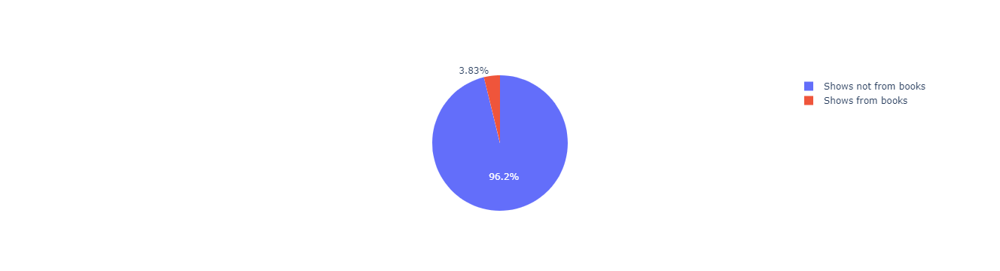

In [87]:
import plotly.graph_objects as go

labels = ['Shows from books','Shows not from books']
values = [248,6234]

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.show()

# To discuss with Terry as the above contents should be enough for presentation 

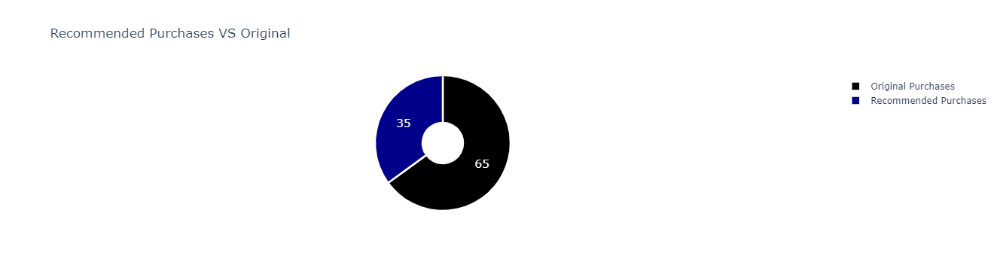

In [1]:
import plotly.graph_objects as go
import plotly.offline as py
autosize =False


# Use `hole` to create a donut-like pie chart
values=[35, 65]
labels=['Recommended Purchases',"Original Purchases"]
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='value',textfont_size=15,
                  marker=dict(colors=['#00008b','#000'], line=dict(color='#FFFFFF', width=2.5)))
fig.update_layout(
    title='Recommended Purchases VS Original')
py.iplot(fig)

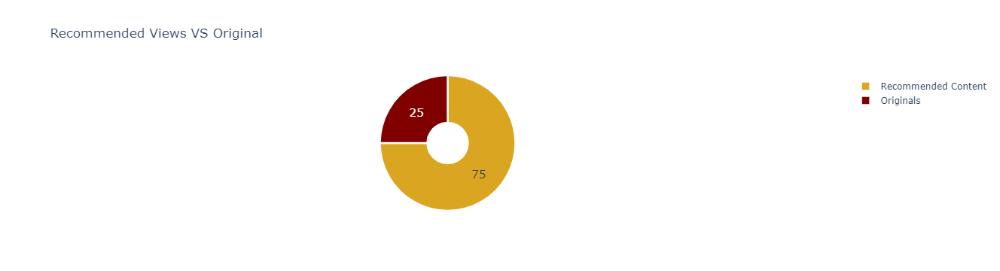

In [2]:
# Use `hole` to create a donut-like pie chart
values=[75, 25]
labels=['Recommended Content',"Originals"]
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='value',textfont_size=15,
                  marker=dict(colors=['#DAA520','#800000'], line=dict(color='#FFFFFF', width=2.5)))
fig.update_layout(
    title='Recommended Views VS Original')
austosize=False
py.iplot(fig)

In [4]:
pip install lightfm


  Created wheel for lightfm: filename=lightfm-1.16-cp37-cp37m-win_amd64.whl size=429098 sha256=c87ca5daa2e851af8a55f509b30bf17233cb1e162b9af91c4990f14726860ecd
  Stored in directory: c:\users\admin\appdata\local\pip\cache\wheels\f8\56\28\5772a3bd3413d65f03aa452190b00898b680b10028a1021914
Successfully built lightfm


In [5]:
import numpy as np
from lightfm.data import Dataset
from lightfm import LightFM
from lightfm.evaluation import precision_at_k
from lightfm.evaluation import auc_score
from lightfm.datasets import fetch_movielens
from lightfm.cross_validation import random_train_test_split
from scipy.sparse import coo_matrix as sp

D:\RW_Programs\Anaconda\envs\pyvizenv\lib\site-packages\lightfm\_lightfm_fast.py:10: UserWarning: LightFM was compiled without OpenMP support. Only a single thread will be used.
  "LightFM was compiled without OpenMP support. "


In [6]:
data = fetch_movielens(min_rating = 4.0)

In [7]:
print(repr(data['train']))
print(repr(data['test']))

<943x1682 sparse matrix of type '<class 'numpy.int32'>'
	with 49906 stored elements in COOrdinate format>
<943x1682 sparse matrix of type '<class 'numpy.int32'>'
	with 5469 stored elements in COOrdinate format>


In [8]:
model = LightFM(loss = 'warp')

In [9]:
model.fit(data["train"], epochs=30, num_threads=2)

In [10]:
def sample_recommendation(model, data, user_ids):
    n_users, n_items = data['train'].shape
    for user_id in user_ids:
        known_positives = data['item_labels'][data['train'].tocsr()                                    
                          [user_id].indices]
        
        scores = model.predict(user_id, np.arange(n_items))

        top_items = data['item_labels'][np.argsort(-scores)]

        print("User %s" % user_id)
        print("     Known positives:")
        
        for x in known_positives[:3]:
            print("        %s" % x)
        
        print("     Recommended:")
        
        for x in top_items[:3]:
            print("        %s" % x)

In [11]:
sample_recommendation(model, data, [6, 25, 451])

User 6
     Known positives:
        Get Shorty (1995)
        Twelve Monkeys (1995)
        Babe (1995)
     Recommended:
        Raiders of the Lost Ark (1981)
        Silence of the Lambs, The (1991)
        Jaws (1975)
User 25
     Known positives:
        Dead Man Walking (1995)
        Star Wars (1977)
        Fargo (1996)
     Recommended:
        Contact (1997)
        Fargo (1996)
        English Patient, The (1996)
User 451
     Known positives:
        Twelve Monkeys (1995)
        Babe (1995)
        Mr. Holland's Opus (1995)
     Recommended:
        Raiders of the Lost Ark (1981)
        Casablanca (1942)
        Star Wars (1977)


In [12]:
import pandas as pd
import numpy as np

In [13]:
books=pd.read_csv("./resources/goodbooks-10k/books.csv")

In [14]:
books

,id,book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,...,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
0,1,2767052,2767052,2792775,272,439023483,9.780439e+12,Suzanne Collins,2008.0,The Hunger Games,...,4780653,4942365,155254,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603m...,https://images.gr-assets.com/books/1447303603s...
1,2,3,3,4640799,491,439554934,9.780440e+12,"J.K. Rowling, Mary GrandPré",1997.0,Harry Potter and the Philosopher's Stone,...,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m...,https://images.gr-assets.com/books/1474154022s...
2,3,41865,41865,3212258,226,316015849,9.780316e+12,Stephenie Meyer,2005.0,Twilight,...,3866839,3916824,95009,456191,436802,793319,875073,1355439,https://images.gr-assets.com/books/1361039443m...,https://images.gr-assets.com/books/1361039443s...
3,4,2657,2657,3275794,487,61120081,9.780061e+12,Harper Lee,1960.0,To Kill a Mockingbird,...,3198671,3340896,72586,60427,117415,446835,1001952,1714267,https://images.gr-assets.com/books/1361975680m...,https://images.gr-assets.com/books/1361975680s...
4,5,4671,4671,245494,1356,743273567,9.780743e+12,F. Scott Fitzgerald,1925.0,The Great Gatsby,...,2683664,2773745,51992,86236,197621,606158,936012,947718,https://images.gr-assets.com/books/1490528560m...,https://images.gr-assets.com/books/1490528560s...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,7130616,7130616,7392860,19,441019455,9.780441e+12,Ilona Andrews,2010.0,Bayou Moon,...,17204,18856,1180,105,575,3538,7860,6778,https://images.gr-assets.com/books/1307445460m...,https://images.gr-assets.com/books/1307445460s...
9996,9997,208324,208324,1084709,19,067973371X,9.780680e+12,Robert A. Caro,1990.0,Means of Ascent,...,12582,12952,395,303,551,1737,3389,6972,https://s.gr-assets.com/assets/nophoto/book/11...,https://s.gr-assets.com/assets/nophoto/book/50...
9997,9998,77431,77431,2393986,60,039330762X,9.780393e+12,Patrick O'Brian,1977.0,The Mauritius Command,...,9421,10733,374,11,111,1191,4240,5180,https://images.gr-assets.com/books/1455373531m...,https://images.gr-assets.com/books/1455373531s...
9998,9999,8565083,8565083,13433613,7,61711527,9.780062e+12,Peggy Orenstein,2011.0,Cinderella Ate My Daughter: Dispatches from th...,...,11279,11994,1988,275,1002,3765,4577,2375,https://images.gr-assets.com/books/1279214118m...,https://images.gr-assets.com/books/1279214118s...


/Users/tareqnieroukh/opt/anaconda3/envs/dev/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='average_rating', ylabel='Density'>

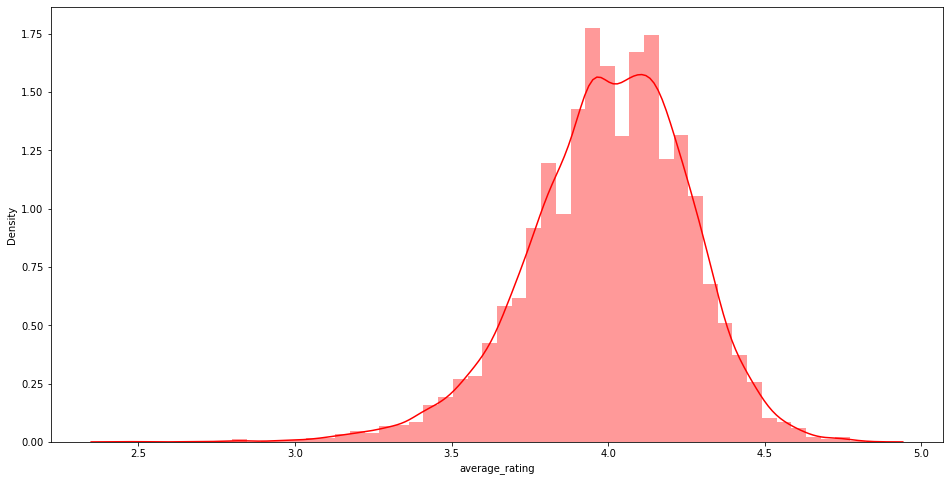

In [15]:
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(16,8))
sns.distplot(a=books['average_rating'], kde=True, color='r')

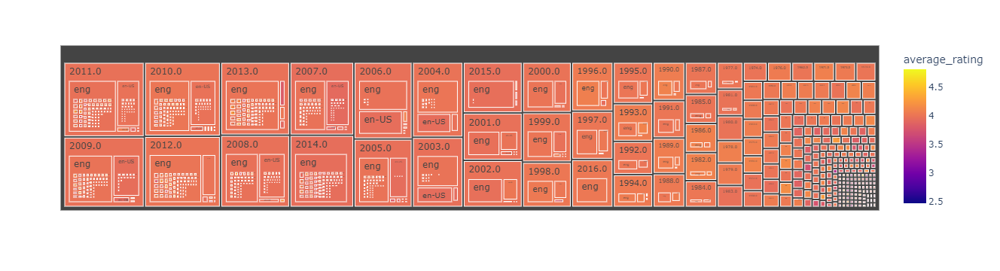

In [16]:
dropna= books.dropna()
fig = px.treemap(dropna, path=['original_publication_year','language_code', "average_rating"],
                  color='average_rating')
fig.show()

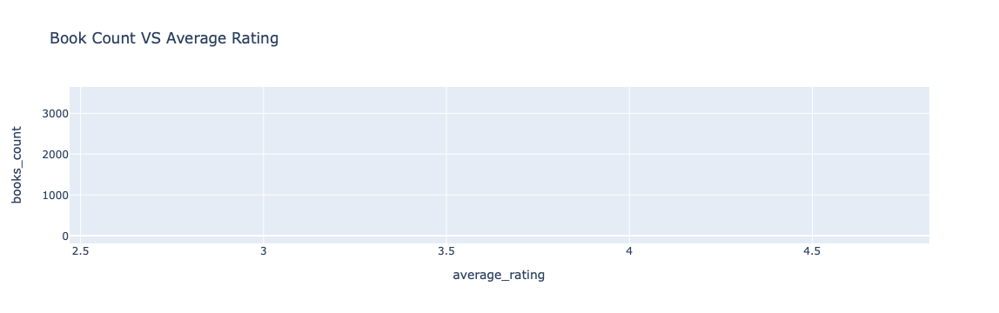

In [17]:
fig = px.line(books, y="books_count", x="average_rating", title='Book Count VS Average Rating')
fig.show()

In [18]:
books.columns

Index(['id', 'book_id', 'best_book_id', 'work_id', 'books_count', 'isbn',
       'isbn13', 'authors', 'original_publication_year', 'original_title',
       'title', 'language_code', 'average_rating', 'ratings_count',
       'work_ratings_count', 'work_text_reviews_count', 'ratings_1',
       'ratings_2', 'ratings_3', 'ratings_4', 'ratings_5', 'image_url',
       'small_image_url'],
      dtype='object')

In [19]:
books_metadata_selected = books[['book_id', 'average_rating', 
'original_publication_year', 'ratings_count', 'language_code']]
books_metadata_selected

,book_id,average_rating,original_publication_year,ratings_count,language_code
0,2767052,4.34,2008.0,4780653,eng
1,3,4.44,1997.0,4602479,eng
2,41865,3.57,2005.0,3866839,en-US
3,2657,4.25,1960.0,3198671,eng
4,4671,3.89,1925.0,2683664,eng
...,...,...,...,...,...
9995,7130616,4.09,2010.0,17204,eng
9996,208324,4.25,1990.0,12582,eng
9997,77431,4.35,1977.0,9421,eng
9998,8565083,3.65,2011.0,11279,eng


In [21]:
pip install pandas_profiling

     |████████████████████████████████| 261 kB 1.3 MB/s            
     |████████████████████████████████| 652 kB 1.1 MB/s            
     |████████████████████████████████| 2.6 MB 2.3 MB/s            
     |████████████████████████████████| 3.1 MB 1.2 MB/s            
     |████████████████████████████████| 102 kB 2.7 MB/s           
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 812 kB 1.6 MB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 4.3 MB 2.6 MB/s            
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=c167e2df5c67f5764165801795dee0d574801ab08063292ac3dccb8cd8a1e77a
  Stored in directory: /Users/tareqnieroukh/Library/Caches/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=0bfeb7965e6a09d6bab5975ebfc014da7df204be55f031a0377206591735e45e

In [22]:
import pandas_profiling

books_metadata_selected.replace('', np.nan, inplace=True)
profile = pandas_profiling.ProfileReport(books_metadata_selected[['average_rating',
                                                                  'original_publication_year', 'ratings_count']])
profile

/Users/tareqnieroukh/opt/anaconda3/envs/dev/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
#rounding the average rating to nearest 0.5 score
books_metadata_selected['average_rating'] = books_metadata_selected['average_rating'].apply(lambda x: round(x*2)/2)

#replacing missing values to the year 
books_metadata_selected['original_publication_year'].replace(np.nan, 2100, inplace=True)

/Users/tareqnieroukh/opt/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/tareqnieroukh/opt/anaconda3/envs/dev/lib/python3.7/site-packages/pandas/core/generic.py:6619: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [24]:
books_metadata_selected['ratings_count'] = pd.qcut(books_metadata_selected['ratings_count'], 25)

/Users/tareqnieroukh/opt/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [26]:
profile = pandas_profiling.ProfileReport(books_metadata_selected[['average_rating',
                                                                  'original_publication_year', 'ratings_count']])
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

ValueError: Value '1.13' should be a ratio between 1 and 0.

In [28]:
interactions=pd.read_csv("./resources/goodbooks-10k/ratings.csv")

In [29]:
from scipy.sparse import *
from scipy import *
item_dict ={}
df = books[['book_id', 'original_title']].sort_values('book_id').reset_index()
for i in range(df.shape[0]):
    item_dict[(df.loc[i,'book_id'])] = df.loc[i,'original_title']
# dummify categorical features
books_metadata_selected_transformed = pd.get_dummies(books_metadata_selected, columns = ['average_rating','original_publication_year', 'ratings_count', 'language_code'])
books_metadata_selected_transformed = books_metadata_selected_transformed.sort_values('book_id').reset_index().drop('index', axis=1)
books_metadata_selected_transformed.head(5)
# convert to csr matrix
books_metadata_csr = csr_matrix(books_metadata_selected_transformed.drop('book_id', axis=1).values)

In [30]:
user_book_interaction = pd.pivot_table(interactions, index='user_id', columns='book_id', values='rating')
# fill missing values with 0
user_book_interaction = user_book_interaction.fillna(0)
user_id = list(user_book_interaction.index)
user_dict = {}
counter = 0 
for i in user_id:
    user_dict[i] = counter
    counter += 1
# convert to csr matrix
user_book_interaction_csr = csr_matrix(user_book_interaction.values)
user_book_interaction_csr

<53424x10000 sparse matrix of type '<class 'numpy.float64'>'
	with 979478 stored elements in Compressed Sparse Row format>

In [31]:
model = LightFM(loss='warp',
                random_state=2016,
                learning_rate=0.90,
                no_components=150,
                user_alpha=0.000005)
model = model.fit(user_book_interaction_csr,
                  epochs=5,
                  num_threads=16, verbose=False)

In [32]:
def sample_recommendation_user(model, interactions, user_id, user_dict, 
                               item_dict,threshold = 0,nrec_items = 5, show = True):
    
    n_users, n_items = interactions.shape
    user_x = user_dict[user_id]
    scores = pd.Series(model.predict(user_x,np.arange(n_items), item_features=books_metadata_csr))
    scores.index = interactions.columns
    scores = list(pd.Series(scores.sort_values(ascending=False).index))
    
    known_items = list(pd.Series(interactions.loc[user_id,:] \
                                 [interactions.loc[user_id,:] > threshold].index).sort_values(ascending=False))
    
    scores = [x for x in scores if x not in known_items]
    return_score_list = scores[0:nrec_items]
    known_items = list(pd.Series(known_items).apply(lambda x: item_dict[x]))
    scores = list(pd.Series(return_score_list).apply(lambda x: item_dict[x]))
    if show == True:
        print ("User: " + str(user_id))
        print("Known Likes:")
        counter = 1
        for i in known_items:
            print(str(counter) + '- ' + str(i))
            counter+=1
    print("\n Recommended Items:")
    counter = 1
    for i in scores:
        print(i)
        print(str(counter) + '- ' + i)
        counter+=1